In [6]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import glob

In [132]:
# dataset
with open("matches_map.json", "r") as f:
    matches_map = json.load(f)
matches_map

{'0NA7OWDQK.jpg': {'top': [[141, 213], [2899, 701]],
  'bottom': [[125, 712], [2913, 1236]]},
 '0CAUQSQDG0.jpg': {'top': [[1, 1544], [2913, 1924]],
  'bottom': [[289, 2008], [2461, 3028]]},
 '0DF1AA42B9.jpg': {'top': [[64, 33], [1062, 153]],
  'bottom': [[203, 184], [927, 520]]},
 '0G1UJLATWE.jpg': {'top': [[49, 113], [3233, 517]],
  'bottom': [[549, 633], [3264, 2286]]},
 '0I6P2YFPAU.jpg': {'top': [[1, 1], [4029, 637]],
  'bottom': [[205, 797], [4029, 2461]]},
 '0OAAZRH8NU.jpg': {'top': [[441, 21], [3613, 377]],
  'bottom': [[885, 505], [3181, 1537]]},
 '0QNHKHHEZ0.jpg': {'top': [[39, 477], [707, 559]],
  'bottom': [[135, 599], [615, 801]]},
 '1B2LRP3F7K.jpg': {'top': [[5, 113], [3257, 605]],
  'bottom': [[345, 717], [3077, 1973]]},
 '1BD5PXLNTK.jpg': {'top': [[1, 509], [4021, 1265]],
  'bottom': [[121, 1185], [3757, 2861]]},
 '1F28E63C50.jpg': {'top': [[73, 489], [4025, 1061]],
  'bottom': [[605, 1125], [3657, 2629]]}}

In [134]:
# mask parameters
#mask_params = {'top': [[100,100,100],[125,150,125]], 'bottom': [[110,0,130],[125,250,250]]} 0.2/0.1
#mask_params = {'top': [[100,100,100],[125,150,200]], 'bottom': [[110,0,130],[125,250,250]]} 0.3/0.1
# mask_params = {'top': [[100,100,100],[125,170,200]], 'bottom': [[110,0,130],[125,250,250]]} 0.5/0.1
# mask_params = {'top': [[100,100,90],[125,180,200]], 'bottom': [[110,0,130],[125,250,250]]} # 0.6/0.1
#mask_params = {'top': [[100,100,90],[125,175,200]], 'bottom': [[110,0,130],[125,250,250]]} # 0.6/0.1
#mask_params = {'top': [[100,100,90],[125,200,200]], 'bottom': [[110,0,130],[125,250,250]]} # 0.7/0.1
# mask_params = {'top': [[100,100,90],[125,200,250]], 'bottom': [[110,0,130],[125,250,250]]} # 0.7/0.1
# mask_params = {'top': [[100,100,90],[125,200,255]], 'bottom': [[110,0,130],[125,250,250]]} # 0.8/0.1
mask_params = {'top': [[100,100,90],[125,255,255]], 'bottom': [[110,0,130],[125,250,250]]} # 1/0.1
mask_params

{'top': [[100, 100, 90], [125, 255, 255]],
 'bottom': [[110, 0, 130], [125, 250, 250]]}

In [135]:
path = 'images\\screen_matches\\'
files = glob.glob(path+'*.jpg')
print(files)

['images\\screen_matches\\0CAUQSQDG0.jpg', 'images\\screen_matches\\0DF1AA42B9.jpg', 'images\\screen_matches\\0G1UJLATWE.jpg', 'images\\screen_matches\\0I6P2YFPAU.jpg', 'images\\screen_matches\\0NA7OWDQK.jpg', 'images\\screen_matches\\0OAAZRH8NU.jpg', 'images\\screen_matches\\0QNHKHHEZ0.jpg', 'images\\screen_matches\\1B2LRP3F7K.jpg', 'images\\screen_matches\\1BD5PXLNTK.jpg', 'images\\screen_matches\\1F28E63C50.jpg']


In [136]:
def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
 
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
 
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
 
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
 
	# return the intersection over union value
	return iou

In [137]:
plt.rcParams.update({'figure.max_open_warning': 0})

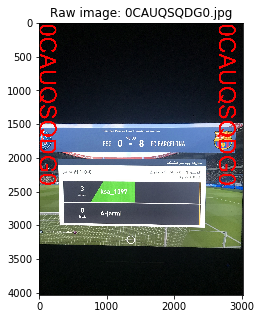

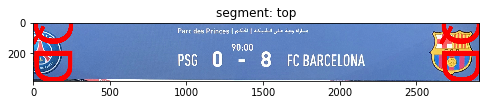

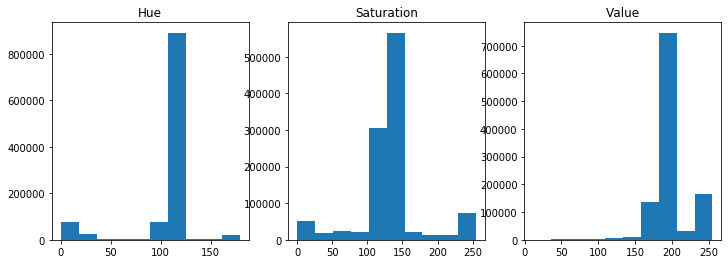

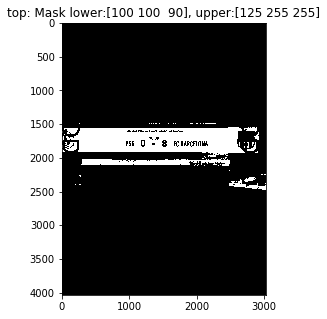

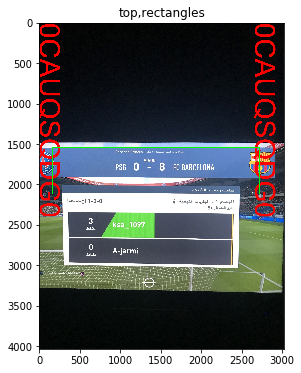

...

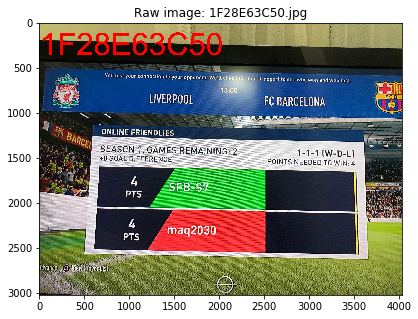

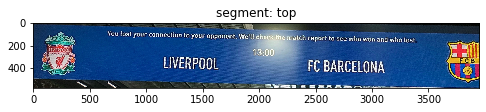

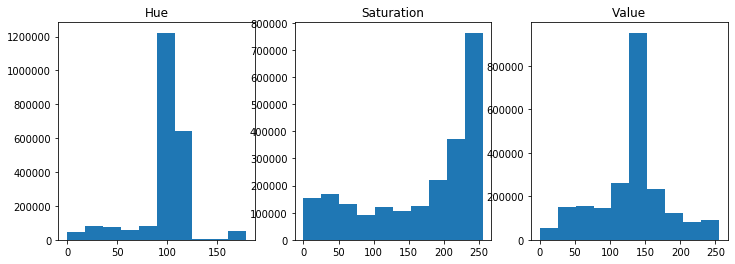

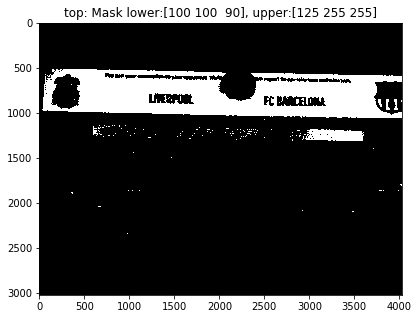

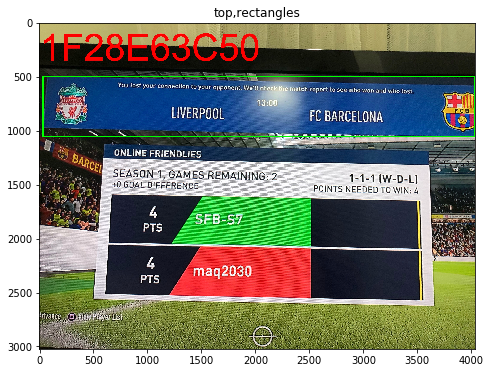

In [147]:
D={}
for f in files:
    f_name = f.split('\\')[-1]
    img = cv2.imread(f)
    
    # convert image to HSV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    plt.figure(figsize=(8,5))
    plt.title(f"Raw image: {f_name}")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_HSV2RGB))
    S={}
    L=[]
    histograms={}
    for s in matches_map[f_name].keys():
    #for s in ['top']:
        x1,y1,x2,y2 = np.array(matches_map[f_name][s]).ravel()
        segment = img[y1:y2,x1:x2,:]
        plt.figure(figsize=(8,5))
        plt.title(f'segment: {s}')
        plt.imshow(cv2.cvtColor(segment, cv2.COLOR_HSV2RGB))
        
        #buid histograms: hue, saturation, value
        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.title('Hue')
        plt.hist(segment[:,:,0].ravel())
        plt.subplot(1,3,2)
        plt.title('Saturation')
        plt.hist(segment[:,:,1].ravel())
        plt.subplot(1,3,3)
        plt.title('Value')
        plt.hist(segment[:,:,2].ravel())
        
        # collect histograms data
        hue_hist, hue_bins = np.histogram(segment[:,:,0].ravel())
        saturation_hist, saturation_bins = np.histogram(segment[:,:,1].ravel())
        value_hist, value_bins = np.histogram(segment[:,:,2].ravel())
        histograms[f_name]= {s: [(hue_hist, hue_bins),(saturation_hist, saturation_bins),(value_hist, value_bins )]}
        
    
        #build mask
        lower = np.array(mask_params[s][0])
        upper = np.array(mask_params[s][1])
        mask = cv2.inRange(img,lower, upper)
        plt.figure(figsize=(8,5))
        plt.title(f'{s}: Mask lower:{lower}, upper:{upper}')
        plt.imshow(mask,cmap='gray')
        
        #find contours
        cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        #print(f'segment: {s}, number of counturs: {len(cnts)}')
        
        img_ed = img.copy()
        cnts_rect = sorted([cv2.boundingRect(c) for c in cnts], key=lambda x: x[2]*x[3], reverse=True)
        if len(cnts_rect)>0:
             for i in cnts_rect[:3]:
#                 x,y,w,h=i
#                 cv2.rectangle(img_ed,(x,y),(x+w,y+h), (0,255,0), 10)
            x,y,w,h=cnts_rect[0]
            cv2.rectangle(img_ed,(x,y),(x+w,y+h), (60,255,255), 10)   
            plt.figure(figsize=(8,6))
            plt.title(f'{s},rectangles')
            plt.imshow(cv2.cvtColor(img_ed,cv2.COLOR_HSV2RGB))
            
            boxA=np.array([x,y,x+w,y+h])
            boxB=np.array(matches_map[f_name][s]).ravel()
            #print(f'boxA: {boxA}, boxB: {boxB}')
            acc = np.round(bb_intersection_over_union(boxA, boxB),2)
        else:
            print('Detection fail')
            acc=0
        S[s]=acc
    D[f_name]=S
        #print(f'file: {f_name}, segment: {s}, iou: {acc}')

In [139]:
D

{'0CAUQSQDG0.jpg': {'top': 0.6, 'bottom': 0.0},
 '0DF1AA42B9.jpg': {'top': 0.98, 'bottom': 0.89},
 '0G1UJLATWE.jpg': {'top': 0.95, 'bottom': 0.01},
 '0I6P2YFPAU.jpg': {'top': 0.62, 'bottom': 0.15},
 '0NA7OWDQK.jpg': {'top': 0.81, 'bottom': 0.03},
 '0OAAZRH8NU.jpg': {'top': 0.59, 'bottom': 0.0},
 '0QNHKHHEZ0.jpg': {'top': 0.96, 'bottom': 0.07},
 '1B2LRP3F7K.jpg': {'top': 0.55, 'bottom': 0.0},
 '1BD5PXLNTK.jpg': {'top': 0.99, 'bottom': 0.12},
 '1F28E63C50.jpg': {'top': 0.96, 'bottom': 0.03}}

In [232]:
def acc(D):
    print(f"Top accuracy IOU > 0.5: {(np.array([D[i]['top'] for i in D.keys()])>0.5).sum()/len(D.keys())}")
    print(f"Top average IOU: {np.array([D[i]['top'] for i in D.keys()]).mean()}")
    print(f"Bottom accuracy: {(np.array([D[i]['bottom'] for i in D.keys()])>0.5).sum()/len(D.keys())}")

In [143]:
acc(D)

Top accuracy IOU > 0.5: 1.0
Top average IOU: 0.8010000000000002
Bottom accuracy: 0.1


## Automatic select threshold for color mask

In [148]:
histograms

{'1F28E63C50.jpg': {'top': [(array([  44041,   79383,   73116,   55432,   83265, 1222385,  643575,
              6265,    3230,   49852], dtype=int64),
    array([  0. ,  17.9,  35.8,  53.7,  71.6,  89.5, 107.4, 125.3, 143.2,
           161.1, 179. ])),
   (array([154102, 169973, 131298,  92742, 120156, 107921, 124625, 222182,
           373573, 763972], dtype=int64),
    array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
           229.5, 255. ])),
   (array([ 55879, 150632, 156949, 147758, 259475, 952373, 235890, 124832,
            83736,  93020], dtype=int64),
    array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
           229.5, 255. ]))]}}

In [152]:
hue_hist, hue_bins = histograms['1F28E63C50.jpg']['top'][0]

In [153]:
hue_hist

array([  44041,   79383,   73116,   55432,   83265, 1222385,  643575,
          6265,    3230,   49852], dtype=int64)

In [157]:
np.argsort(hue_hist)

array([8, 7, 0, 9, 3, 2, 1, 4, 6, 5], dtype=int64)

In [160]:
hue_hist[np.argsort(hue_hist)[-3:]]

array([  83265,  643575, 1222385], dtype=int64)

In [159]:
hue_bins[np.argsort(hue_hist)[-3:]]

array([ 71.6, 107.4,  89.5])

In [ ]:
hue_bins.argmax()

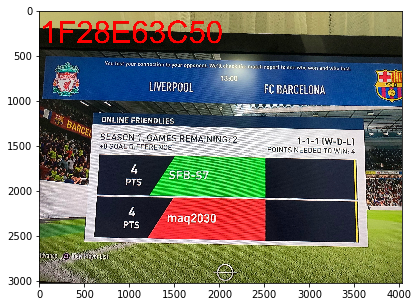

In [163]:
f='images\\screen_matches\\1F28E63C50.jpg'
f_name = f.split('\\')[-1]
img = cv2.imread(f)
img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.figure(figsize=(8,5))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_HSV2RGB))

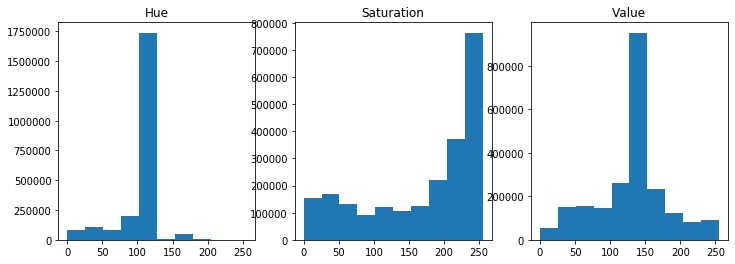

In [214]:
x1,y1,x2,y2 = np.array(matches_map[f_name]['top']).ravel()
segment = img[y1:y2,x1:x2,:]
#(hue_hist, hue_bins),(saturation_hist, saturation_bins),(value_hist, value_bins )
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.title('Hue')
hue_hist= plt.hist(segment[:,:,0].ravel(),bins=np.linspace(0,255,11))
plt.subplot(1,3,2)
plt.title('Saturation')
saturation_hist = plt.hist(segment[:,:,1].ravel(),bins=np.linspace(0,255,11))
plt.subplot(1,3,3)
plt.title('Value')
value_hist = plt.hist(segment[:,:,2].ravel(),bins=np.linspace(0,255,11))

In [224]:
def lower_upper(h):
    # h[1][np.argmax(h[0])], h[1][np.argmax(h[0])+1]    acc_top = 0.5 / avr_iou = 0.613
    # h[1][np.argmax(h[0])-1], h[1][np.argmax(h[0])+1]  acc_top = 0.7/ avr_iou = 0.673
    return h[1][np.argmax(h[0])], h[1][np.argmax(h[0])+1]

In [215]:
hue_lower, hue_upper = lower_upper(hue_hist)
print(f'Hue. lower: {hue_lower}, upper: {hue_upper}')

Hue. lower: 76.5, upper: 127.5


In [216]:
saturation_lower, saturation_upper = lower_upper(saturation_hist)
print(f'saturation. lower: {saturation_lower}, upper: {saturation_upper}')

saturation. lower: 204.0, upper: 255.0


In [217]:
value_lower, value_upper = lower_upper(value_hist)
print(f'value. lower: {value_lower}, upper: {value_upper}')

value. lower: 102.0, upper: 153.0


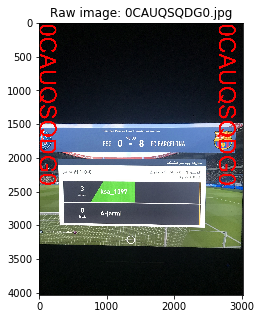

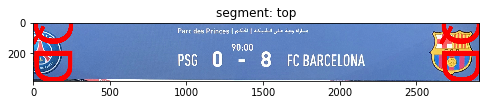

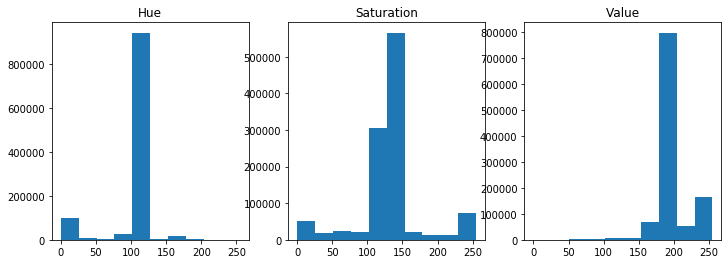

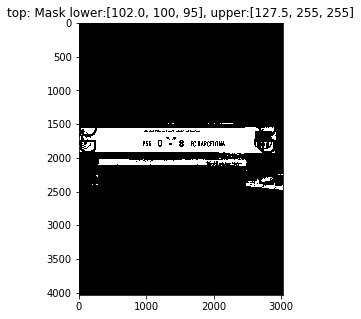

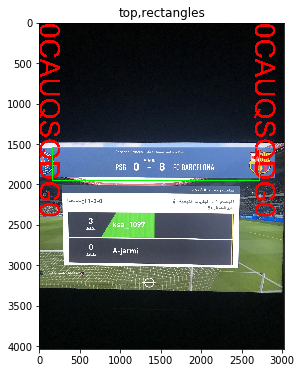

...

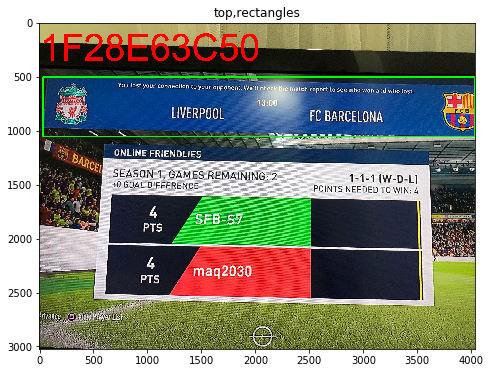

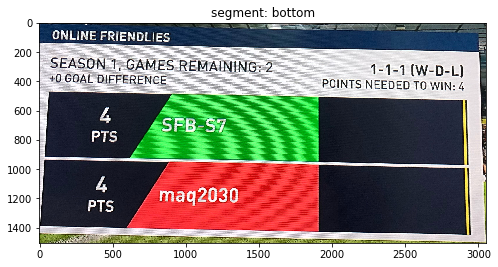

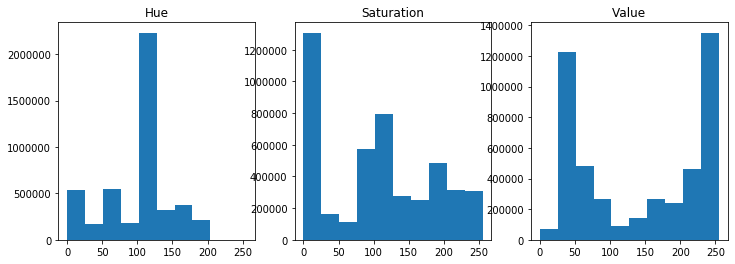

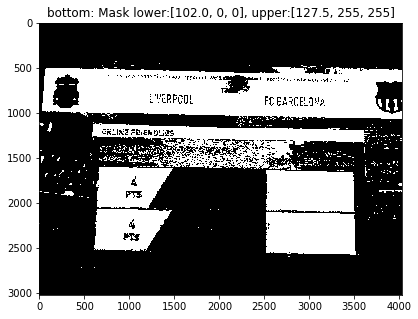

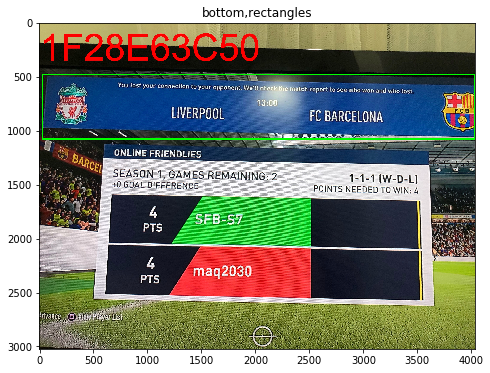

In [267]:
D={}
for f in files:
    f_name = f.split('\\')[-1]
    img = cv2.imread(f)
    
    # convert image to HSV
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    plt.figure(figsize=(8,5))
    plt.title(f"Raw image: {f_name}")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_HSV2RGB))
    S={}
    L=[]
    histograms={}
    files_masks={}
    for s in matches_map[f_name].keys():
    #for s in ['top']:
        x1,y1,x2,y2 = np.array(matches_map[f_name][s]).ravel()
        segment = img[y1:y2,x1:x2,:]
        plt.figure(figsize=(8,5))
        plt.title(f'segment: {s}')
        plt.imshow(cv2.cvtColor(segment, cv2.COLOR_HSV2RGB))
        
        #buid histograms: hue, saturation, value
        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.title('Hue')
        hue_hist = plt.hist(segment[:,:,0].ravel(),bins=np.linspace(0,255,11))
        plt.subplot(1,3,2)
        plt.title('Saturation')
        saturation_hist = plt.hist(segment[:,:,1].ravel(),bins=np.linspace(0,255,11))
        plt.subplot(1,3,3)
        plt.title('Value')
        value_hist = plt.hist(segment[:,:,2].ravel(),bins=np.linspace(0,255,11))
        
        # collect histograms data
#         hue_hist, hue_bins = np.histogram(segment[:,:,0].ravel(),bins=)
#         saturation_hist, saturation_bins = np.histogram(segment[:,:,1].ravel())
#         value_hist, value_bins = np.histogram(segment[:,:,2].ravel())
#         histograms[f_name]= {s: [(hue_hist, hue_bins),(saturation_hist, saturation_bins),(value_hist, value_bins )]}
        
    
        #build mask
        #lower = np.array(mask_params[s][0])
        #upper = np.array(mask_params[s][1])
        lower_list = []
        upper_list = []
        mask_params = {}
        
#         for t in [hue_hist, saturation_hist, value_hist]:
#             lower, upper = lower_upper(t)
#             lower_list.append(lower)
#             upper_list.append(upper)

        for t in [hue_hist]:
            lower, upper = lower_upper(t)
            lower_list.append(lower)
       
            upper_list.append(upper)
        if s == 'top':
            lower_list.append(100)
            lower_list.append(95)   
            upper_list.append(255)
            upper_list.append(255)
        else:
            lower_list.append(0)
            lower_list.append(0)   
            upper_list.append(255)
            upper_list.append(255)
            
        
        mask_params[s] = [lower_list,upper_list]
        
        
        mask = cv2.inRange(img,np.array(lower_list), np.array(upper_list))
        plt.figure(figsize=(8,5))
        plt.title(f'{s}: Mask lower:{lower_list}, upper:{upper_list}')
        plt.imshow(mask,cmap='gray')
        
        #find contours
        cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        #print(f'segment: {s}, number of counturs: {len(cnts)}')
        
        img_ed = img.copy()
        cnts_rect = sorted([cv2.boundingRect(c) for c in cnts], key=lambda x: x[2]*x[3], reverse=True)
        if len(cnts_rect)>0:
#             for i in cnts_rect[:3]:
#                 x,y,w,h=i
#                 cv2.rectangle(img_ed,(x,y),(x+w,y+h), (0,255,0), 10)
            x,y,w,h=cnts_rect[0]
            cv2.rectangle(img_ed,(x,y),(x+w,y+h), (60,255,255), 10)   
            plt.figure(figsize=(8,6))
            plt.title(f'{s},rectangles')
            plt.imshow(cv2.cvtColor(img_ed,cv2.COLOR_HSV2RGB))
            
            boxA=np.array([x,y,x+w,y+h])
            boxB=np.array(matches_map[f_name][s]).ravel()
            #print(f'boxA: {boxA}, boxB: {boxB}')
            acc = np.round(bb_intersection_over_union(boxA, boxB),2)
        else:
            print('Detection fail')
            acc=0
        S[s]=acc
    D[f_name]=S
    files_masks[f_name] = mask_params
        #print(f'file: {f_name}, segment: {s}, iou: {acc}')

In [268]:
D

{'0CAUQSQDG0.jpg': {'top': 0.81, 'bottom': 0.12},
 '0DF1AA42B9.jpg': {'top': 0.98, 'bottom': 0.41},
 '0G1UJLATWE.jpg': {'top': 0.91, 'bottom': 0.51},
 '0I6P2YFPAU.jpg': {'top': 0.62, 'bottom': 0.52},
 '0NA7OWDQK.jpg': {'top': 0.81, 'bottom': 0.43},
 '0OAAZRH8NU.jpg': {'top': 0.59, 'bottom': 0.43},
 '0QNHKHHEZ0.jpg': {'top': 0.97, 'bottom': 0.03},
 '1B2LRP3F7K.jpg': {'top': 0.56, 'bottom': 0.54},
 '1BD5PXLNTK.jpg': {'top': 0.99, 'bottom': 0.53},
 '1F28E63C50.jpg': {'top': 0.95, 'bottom': 0.0}}

In [269]:
print(f"Top accuracy IOU > 0.5: {(np.array([D[i]['top'] for i in D.keys()])>0.5).sum()/len(D.keys())}")
print(f"Top average IOU: {np.array([D[i]['top'] for i in D.keys()]).mean()}")
print(f"Bottom accuracy: {(np.array([D[i]['bottom'] for i in D.keys()])>0.5).sum()/len(D.keys())}")
print(f"Top average IOU: {np.array([D[i]['bottom'] for i in D.keys()]).mean()}")
      

Top accuracy IOU > 0.5: 1.0
Top average IOU: 0.819
Bottom accuracy: 0.4
Top average IOU: 0.35200000000000004


In [170]:
np.linspace(0,255,11)

array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
       229.5, 255. ])

In [166]:
range(0,255,25)

range(0, 255, 25)

In [167]:
for i in range(0,255,25):
    print(i)

0
25
50
75
100
125
150
175
200
225
250


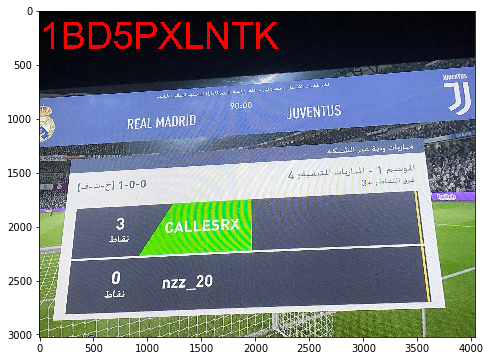

In [131]:
img = cv2.imread('images/screen_matches/1BD5PXLNTK.jpg')
plt.figure(figsize=(8,6))
img_ed = cv2.rectangle()
plt.imshow( cv2.cvtColor(img_ed, cv2.COLOR_BGR2RGB))